# Network Science Project
## Twitch Streamer Interaction Network

The dataset from [Kaggle](https://www.kaggle.com/datasets/volodymyrpivoshenko/twitch-live-streaming-interactions-dataset?resource=download&select=100k_a.csv) contains information about interactions between users on Twitch. The dataset contains the following columns: 
- User ID (anonymized)
- Stream ID
- Streamer username
- Time start 
- Time end

I will model the graph as streamer to streamer interactions (**undirected graph**). The nodes will represent the streamers and the edges between two streamers exist if they have viewers in common.
The **weight** of the edge will be the number of common viewers. 
Nodes will have an **attribute** 'user_count' which will symbolize the number of unique viewers of that specific streamer.

A weighted graph in this context will help us understand the connections between streamers.

Through webscraping, I will define the 'topic' and 'language' of the streamer. This will help us understand if communities, created whithout the knowledge of these attributes, are based on the topic or language of the streamer. 

## Goal of the project
The projects aims to analyze the graph and find the most influential streamers, communities and also run language/topic prediction of the streamers.


### Steps

1. Data Preprocessing: 
    - Read the data
    - Create the graph
    - Add attributes to the nodes
    - Add weights to the edges
    - Add language and topic of the streamer
    - Save the graph

2. Exploratory Data Analysis:
    - Analysis on the attributes of the graph
    - Number of nodes
    - Number of edges
    - Average, minimum and maximum degree
    - Degree distribution
3. Network Analysis:
    - Degree centrality
    - Betweenness centrality
    - Closeness centrality
    - Eigenvector centrality
    - Clustering coefficient
    - Density
    - Comparison with random graph
4. Community Detection:
    - Louvain method
    - Greedy modularity optimization
5. ML Models:
    - Reccommendation system
    - Language prediction
    - Topic prediction

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
from itertools import combinations

# Web scraping
import requests
from bs4 import BeautifulSoup
import time

# Network analysis
import networkx as nx
from networkx.algorithms import community
from statsmodels.distributions.empirical_distribution import ECDF
from sklearn.metrics import normalized_mutual_info_score

# XML parsing
import xml.etree.cElementTree as ET

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image

# Machine learning
from node2vec import Node2Vec
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Parallel processing
from joblib import Parallel, delayed, parallel_backend

### Creating the graph

In [82]:
df = pd.read_csv('100k_a.csv', header=None)
df.drop(columns=[1, 3, 4], inplace=True)
df.columns = ['user_id', 'streamer']    
df.drop_duplicates(inplace=True)
df.head()

,user_id,streamer
0,1,mithrain
1,1,alptv
3,1,wtcn
4,1,jrokezftw
5,1,berkriptepe


In [ ]:
G = nx.Graph()

# Add nodes (streamers) with their user count (size)
streamer_counts = df['streamer'].value_counts()
for streamer, count in streamer_counts.items():
    G.add_node(streamer, user_count=count)

streamer_users = df.groupby('streamer')['user_id'].apply(set).to_dict()

# Add edges with weights (shared users)
for streamer1, streamer2 in combinations(streamer_users.keys(), 2):
    shared_users = len(streamer_users[streamer1] & streamer_users[streamer2])
    if shared_users > 0:  # Add edge only if there are shared users (later we can filter by this weight)
        G.add_edge(streamer1, streamer2, weight=shared_users)

nx.write_graphml(G, 'twitch_graph.graphml')

In [107]:
def read_graphml(filename, min_weight=1):
    G = nx.Graph()
    key_mapping = {}
    
    for _, elem in ET.iterparse(filename, events=('start',)):
        if elem.tag.endswith('key'):
            key_id = elem.get('id') # key id es. d0
            key_for = elem.get('for') # node o edge
            attr_name = elem.get('attr.name') # user_count o weight
            key_mapping[key_id] = (key_for, attr_name) # key_mapping['d0'] = ('edge', 'weight')
            elem.clear() 
            continue
            
        if elem.tag.endswith('node'): 
            node_id = elem.get('id') # node id
            for data in elem.findall('{http://graphml.graphdrawing.org/xmlns}data'): # for each data element
                key = data.get('key') 
                if key in key_mapping and key_mapping[key][0] == 'node' and key_mapping[key][1] == 'user_count': 
                    if data.text is not None:
                        G.add_node(node_id, user_count=int(data.text)) # add node with user_count attribute
                    break
            elem.clear()
            continue
            
        if elem.tag.endswith('edge'):
            source = elem.get('source') # source node id
            target = elem.get('target') # target node id
            for data in elem.findall('{http://graphml.graphdrawing.org/xmlns}data'):
                key = data.get('key')
                if key in key_mapping and key_mapping[key][0] == 'edge' and key_mapping[key][1] == 'weight':
                    if data.text is not None:
                        weight = float(data.text)
                        if weight > min_weight:
                            G.add_edge(source, target, weight=weight) # add edge with weight attribute
                    break
            elem.clear()

    return G

G = read_graphml('twitch_graph.graphml', min_weight=10)
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_nodes_from([n for n in G.nodes if 'user_count' not in G.nodes[n]])
# keep nodes with at least 5 connections
while any(G.degree(n) < 5 for n in G.nodes):
    G.remove_nodes_from([n for n in G.nodes if G.degree(n) < 5])

For computational reasons, I will only consider nodes with edges having at least weight 10 and nodes with at least 5 connections.

In [108]:
nx.write_graphml(G, 'streamer_graph.graphml')

In [108]:
G = nx.read_graphml('streamer_graph.graphml')

### Data Scraping

I will scrape the language and main topic of the streamer from the [twitchtracker](https://twitchtracker.com) website.

Two problems that I might face:
- The dataset is old and the streamers might have changed their main topic
- The dataset is old and the streamers might have changed their username
- Big dataset, might take a long time to scrape

In [ ]:
def scrape_streamer_info(streamer_name, max_retries=5):
    url = f"https://twitchtracker.com/{streamer_name.lower()}"
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'
    }

    retries = 0
    while retries <= max_retries:
        try:
            response = requests.get(url, headers=headers)

            if response.status_code == 429: # Too many requests
                retries += 1
                wait_time = 2 ** retries  
                time.sleep(wait_time)
                continue  

            if response.status_code != 200:
                print(f'Error {response.status_code} for {streamer_name}.')
                return None
            
            soup = BeautifulSoup(response.content, 'html.parser')

            language_element = soup.find('a', {'class': 'label label-soft', 'href': lambda x: x and '/languages/' in x})
            language = language_element.text.strip() if language_element else "Not found"

            topic = ""
            topic_section = soup.find('div', {'id': 'channel-games'})
            if topic_section:
                topic_a = topic_section.find_all('a', {'class': 'entity'})
                if topic_a:
                    topic_div = topic_a[0].find('div', {'data-toggle': 'tooltip'})
                    topic = topic_div.get('title', 'Unknown') if topic_div else 'Unknown'

            return {'language': language, 'topic': topic}

        except requests.exceptions.RequestException as e:
            print(f"Error while fetching data: {e} for {streamer_name}")
            return None

        except Exception as e:
            print(f'Error while parsing data: {e} for {streamer_name}')
            return None

    print(f'Number of retries exceeded for {streamer_name}')
    return None

In [ ]:
not_found = []
for streamer in G.nodes:
    info = scrape_streamer_info(streamer)
    if info:
        G.nodes[streamer]['language'] = info['language']
        G.nodes[streamer]['topic'] = info['topic']
    else:
        not_found.append(streamer)

Error 404 for tsm_myth.
Error 404 for tsm_hamlinz.
Error 404 for dreamhackcs.
Error 404 for mrfreshasian.
Error 404 for tsm_daequan.
Error 404 for c9sneaky.
Error 404 for moonmoon_ow.
Error 404 for iwilldominate.
Error 404 for squeezielive.
Error 404 for lck_korea.
Error 403 for gamesdonequick.
Error 404 for pow3rtv.
Error 404 for rajjpatel.
Error 404 for apokalyptotletshe.
Error 404 for kinggeorgetv.
Error 404 for dota2mc_ru.
Error 404 for esl_csgob.
Error 404 for blastproseries.
Error 404 for esl_brazil.
Error 404 for xgladd.
Error 404 for jrokezftw.
Error 404 for mendokusaii.
Error 404 for amarcodtv.
Error 404 for raskology_.
Error 404 for pankylol.
Error 404 for ml7_ow.
Error 404 for i1ame_ru.
Error 404 for ibaailvp.
Error 404 for tutopolistv.
Error 404 for followgrubby.
Error 404 for mirandakerry.
Error 404 for limit_maximum.
Error 404 for solaaaa.
Error 404 for sackzitv.
Error 404 for tmbren.
Error 404 for 404brokenblade.
Error 404 for uccleague.
Error 404 for nicksss.
Error 404 

In [141]:
for streamer in not_found:
    if G.nodes[streamer]['user_count'] > 1000: # Big streamers that we want to keep
        print(streamer)

tsm_myth
tsm_hamlinz
dreamhackcs
mrfreshasian
tsm_daequan
c9sneaky
moonmoon_ow
iwilldominate
squeezielive
lck_korea
gamesdonequick
pow3rtv
rajjpatel


In [177]:
#rename streamer with user_count > 1000 (old username -> new username)
rename = {
    'tsm_myth': 'myth',
    'tsm_hamlinz': 'nrg_hamlinz',
    'dreamhackcs': 'dreamhack',
    'mrfreshasian': 'fresh',
    'tsm_daequan': 'daequanwoco',
    'c9sneaky': 'sneakylol',
    'moonmoon_ow': 'moonmoon',
    'iwilldominate': 'iwdominate',
    'squeezielive': 'squeezie',
    'lck_korea': 'lck',
    'gamesdonequick': 'gamesdonequick',
    'pow3rtv': 'pow3r',
    'rajjpatel': 'austinshow'
}

G = nx.relabel_nodes(G, rename)

for new in rename.values():
    info = scrape_streamer_info(new)
    if info:
        G.nodes[new]['language'] = info['language']
        G.nodes[new]['topic'] = info['topic']
    else:
        print(f'Error while fetching data for {new}')

Error 403 for gamesdonequick.
Error while fetching data for gamesdonequick


In [178]:
G.nodes['gamesdonequick']['language'] = 'English'
G.nodes['gamesdonequick']['topic'] = 'Special Events'

In [180]:
G.order() - len(not_found) + len(rename)

5264

In [183]:
empty_topic = [streamer for streamer, topic in nx.get_node_attributes(G, 'topic').items() if topic == '']
for streamer in empty_topic:
    del G.nodes[streamer]['topic'] 

In [182]:
# save the graph with the new attributes
nx.write_gexf(G, 'streamer_community_attributes.gexf')

# Data Analysis

Run the code from here

In [ ]:
nx.read_gexf('streamer_community_attributes.gexf')

### Top topics and languages

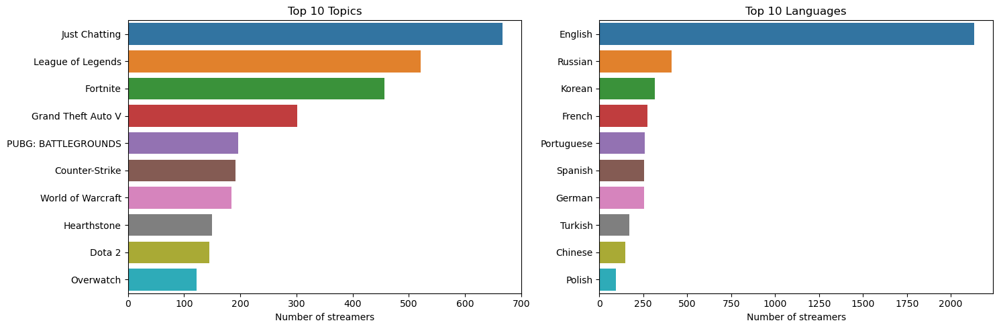

In [184]:
# show top 10 topics and languages
topics = pd.Series(nx.get_node_attributes(G, 'topic')).value_counts().head(10)
languages = pd.Series(nx.get_node_attributes(G, 'language')).value_counts().head(10)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.barplot(x=topics.values, y=topics.index, ax=ax[0])
ax[0].set_title('Top 10 Topics')
ax[0].set_xlabel('Number of streamers')
sns.barplot(x=languages.values, y=languages.index, ax=ax[1])
ax[1].set_title('Top 10 Languages')
ax[1].set_xlabel('Number of streamers')
plt.tight_layout()
plt.show()

As expected the top language is English by a large margin.

The best topic is 'Just Chatting' which is a category where streamers can talk about anything. Apart of 'Just Chatting' every other topic is a game.  

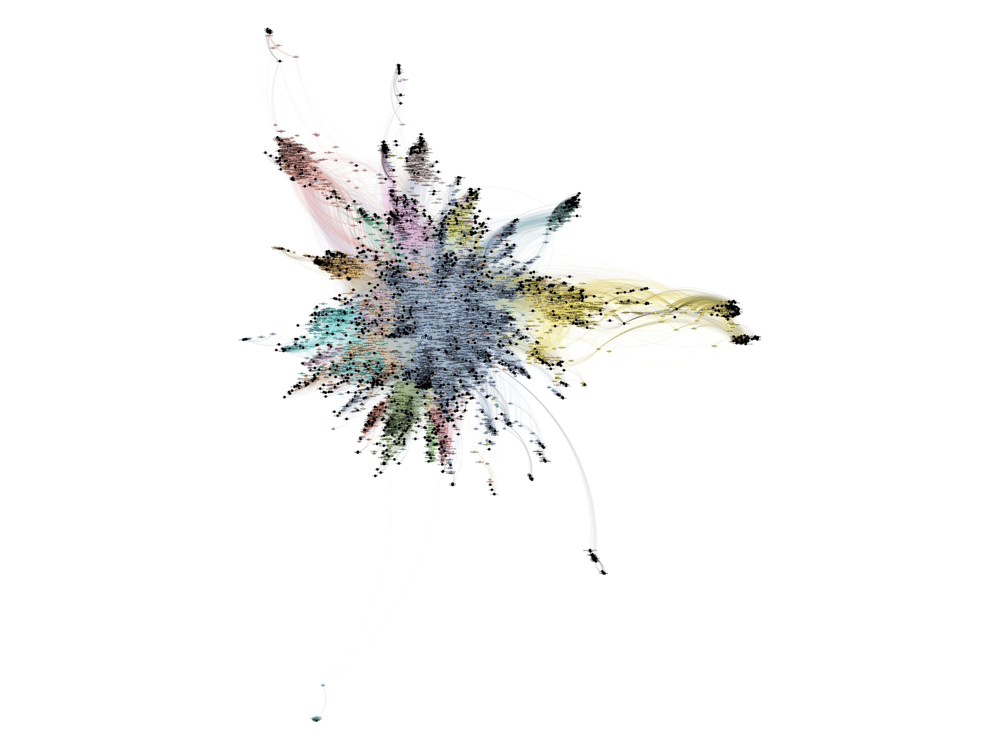

In [5]:
Image(filename='Images/language.png') #uncomment this line to show the image

It's clear from the graph that streamers with the same language are more likely to have common viewers. This is expected since viewers that speak the same language are more likely to watch streamers speaking the same language.

In [ ]:
#Image(filename='Images/topic.png') uncomment this line to show the image

The same behavior is observed for the topic of the streamer but thare are groups with the same topic in different parts of the graph. This is probably becasue the topic is the same but the language is different. 

### Number of nodes and edges

In [185]:
n_nodes, n_edges = G.order(), G.size()

print(f'Number of nodes: {n_nodes}')
print(f'Number of edges: {n_edges}')

Number of nodes: 6378
Number of edges: 178494


### Top streamers by 'user_count' and 'weight'

In [186]:
def top_size(G, n=20):
    return sorted(G.nodes(data=True), key=lambda x: x[1]['user_count'], reverse=True)[:n]

def top_weight(G, n=20):
    return sorted(G.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:n]

In [192]:
first_nodes = top_size(G, 10)
for node in first_nodes:
   print(f'Node: {node[0]}, User count: {node[1]["user_count"]}')

Node: ninja, User count: 17154
Node: tfue, User count: 14460
Node: shroud, User count: 11011
Node: riotgames, User count: 7747
Node: sodapoppin, User count: 5982
Node: nickmercs, User count: 5953
Node: dakotaz, User count: 5939
Node: fortnite, User count: 5721
Node: timthetatman, User count: 5367
Node: symfuhny, User count: 5263


In [193]:
first_edges = top_weight(G, 10)
for edge in first_edges:
    print(f'Edge: {edge[0]} - {edge[1]}, Weight: {edge[2]["weight"]}')

Edge: ninja - tfue, Weight: 9131.0
Edge: ninja - nickmercs, Weight: 4562.0
Edge: tfue - nickmercs, Weight: 4512.0
Edge: ninja - dakotaz, Weight: 4268.0
Edge: tfue - fortnite, Weight: 4118.0
Edge: tfue - symfuhny, Weight: 4068.0
Edge: ninja - fortnite, Weight: 4002.0
Edge: ninja - timthetatman, Weight: 3932.0
Edge: ninja - symfuhny, Weight: 3919.0
Edge: tfue - dakotaz, Weight: 3869.0


### Comment
Looking at this data I think it's made in 2019, Fornite was on hype and the top streamers are Fornite streamers (ninja, tfue, etc).  

The number of users is very low because it isn't the whole dataset (a complete one was about 18GB), but they still give us a good idea of the real and complete graph.

In [194]:
degrees = list(dict(G.degree()).values())
avg_degree = np.mean(degrees)
std_degree = np.std(degrees)
min_degree = np.min(degrees)
max_degree = np.max(degrees)

print(f'Average degree: {avg_degree}')
print(f'Standard deviation of degrees: {std_degree}')
print(f'Minimum degree: {min_degree}')
print(f'Maximum degree: {max_degree}')

Average degree: 55.97177798682973
Standard deviation of degrees: 120.3899557374466
Minimum degree: 5
Maximum degree: 3009


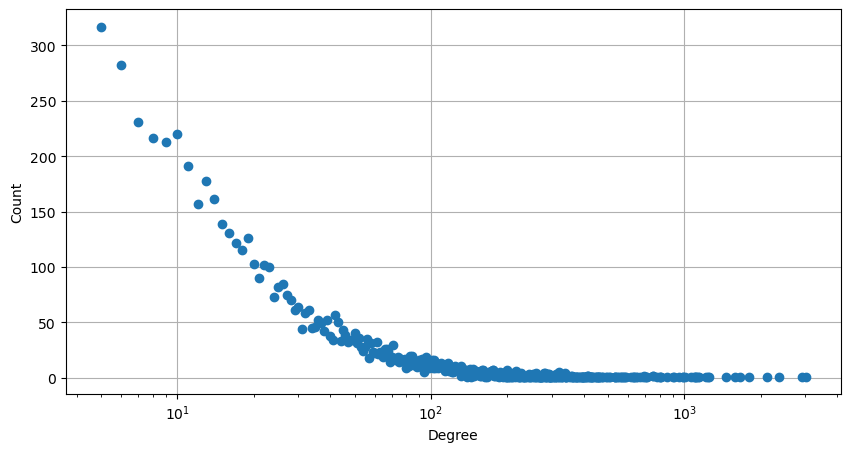

In [209]:
plt.figure(figsize=(10, 5))
plt.plot(*np.unique(degrees, return_counts=True), marker='o', linestyle='none')
plt.xscale('log')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.grid(True)
plt.show()

From this values, we can see that the graph is very sparse, with a high standard deviation of degrees. This means that there are streamers with high number of connections and a lot of streamers with low number of connections.
Let's plot the degree distribution of the graph.

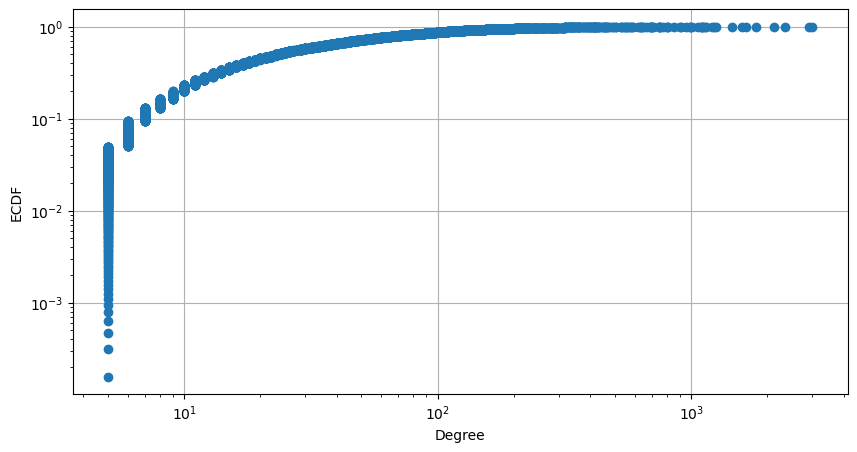

In [206]:
plt.figure(figsize=(10, 5))
ecdf = ECDF(degrees)
plt.plot(ecdf.x, ecdf.y, marker='o', linestyle='none')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree')
plt.ylabel('ECDF')
plt.grid(True)
plt.show()

We can see that the degree distribution is a power-law distribution, which is expected in social networks. This means that most streamers have a low number of common viewers, while a few streamers have a very high number of common viewers (as we saw in the previous analysis).

In [196]:
percentile_99 = np.percentile(degrees,99)
print(f'The 99th percentile of degrees is {round(percentile_99)}')

The 99th percentile of degrees is 470


In [197]:
hubs = [k for k,v in dict(G.degree()).items() if v>= percentile_99]
print("Popular streamers (in terms of connections):")
for hub in hubs:
    print(hub, G.nodes[hub]['user_count'])

Popular streamers (in terms of connections):
ninja 17154
tfue 14460
shroud 11011
riotgames 7747
sodapoppin 5982
nickmercs 5953
dakotaz 5939
fortnite 5721
timthetatman 5367
symfuhny 5263
summit1g 5243
esl_csgo 5170
asmongold 4677
xqcow 4069
drdisrespect 3888
drlupo 3829
myth 3787
loltyler1 3733
couragejd 3677
solaryfortnite 3657
aydan 3624
faker 3440
nrg_hamlinz 3398
sypherpk 3090
lirik 3076
pokimane 3051
chap 3046
tfblade 2998
yassuo 2997
mrsavage 2961
amouranth 2930
dreamhack 2917
cloakzy 2842
playhearthstone 2838
nightblue3 2751
daequanwoco 2713
dota2ruhub 2713
mongraal 2700
overwatchleague 2662
faceittv 2310
imaqtpie 2264
loeya 2102
forsen 1989
chocotaco 1980
cohhcarnage 1946
sneakylol 1916
esfandtv 1833
thijs 1832
maximilian_dood 1803
nl_kripp 1761
moonmoon 1696
iwdominate 1626
cdnthe3rd 1602
greekgodx 1528
lord_kebun 1512
methodjosh 1487
disguisedtoast 1403
dogdog 1283
reckful 1260
s1mple 1236
gamesdonequick 1176
quin69 1166
austinshow 1139
admiralbahroo 1112


I considered hubs to be streamers that are in the 99th percentile of the degree distribution because they have a very high number of connections.

In [198]:
clust_coef = nx.clustering(G)
avg_clust_coef = np.mean(list(clust_coef.values()))
print(f'Average clustering coefficient: {round(avg_clust_coef,2)}')

Average clustering coefficient: 0.81


The average clustering coefficient is very high, which means that the graph is very clustered. This is expected in social networks, where nodes tend to form clusters.

In [199]:
components = list(nx.connected_components(G))
print(f'Number of connected components: {len(components)}')
print(f'Sizes of the connected components: {[len(c) for c in components]}')

Number of connected components: 1
Sizes of the connected components: [6378]


The graph is connected, which means that there is a path between every pair of nodes. So we have to consider the whole graph for the analysis.

## Comparison with a random graph (Erdos-Renyi model)

A random graph is a graph where edges are placed between nodes randomly. The Erdos-Renyi model is a random graph model where the probability of an edge between two nodes is constant.

To compare a real graph with a random graph we have to create a random graph with the same number of nodes and p = density of the real graph.

Formula:  

$p = \Delta = \frac{2L}{N(N-1)} = \frac{<d>}{N-1}$

Where:
- $L$ is the number of edges
- $N$ is the number of nodes
- $<d>$ is the average degree ($\frac{2L}{N}$)

In [ ]:
p = nx.density(G) 
p

0.008777133132637562

In [201]:
random_graph = nx.fast_gnp_random_graph(n_nodes, p)
print('Number of nodes: {}'.format(random_graph.order()))
print('Number of links: {}'.format(random_graph.size()))

Number of nodes: 6378
Number of links: 178602


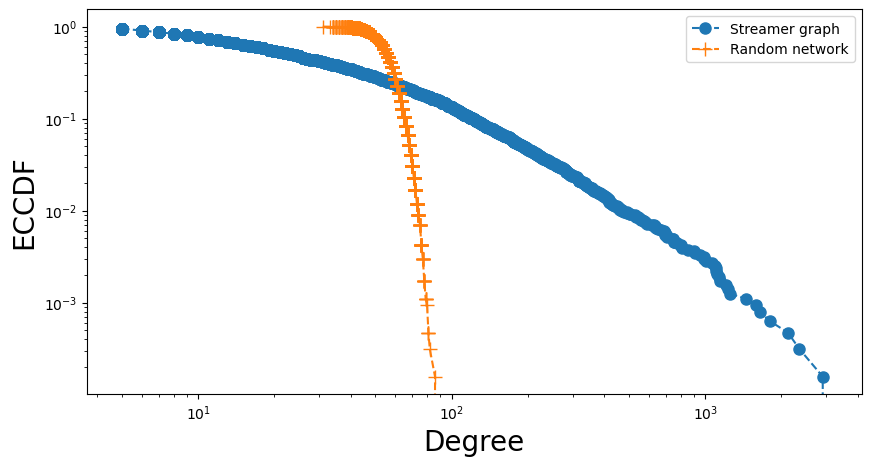

In [261]:
random_degrees = list(dict(random_graph.degree()).values())

ecdf_true = ECDF(degrees)
x_true = np.sort(degrees) 
y_true = 1 - ecdf_true(x_true)

ecdf_random = ECDF(random_degrees)
x_random = np.sort(random_degrees)
y_random = 1 - ecdf_random(x_random)

fig = plt.figure(figsize=(10, 5))
ax = fig.gca()
ax.set_xscale('log')
ax.set_yscale('log')

ax.loglog(x_true, y_true, marker='o', ms=8, linestyle='--', label='Streamer graph')
ax.loglog(x_random, y_random, marker='+', ms=10, linestyle='--', label='Random network')

ax.set_xlabel('Degree', size=20)
ax.set_ylabel('ECCDF', size=20)
ax.legend(fontsize=10)
plt.show()


The plot shows the **Empirical Complementary Cumulative Distribution Function (ECCDF)** for two different networks on a log-log scale:

1. **Streamer Graph** (blue curve with circles):
   - The tail of the distribution follows a gradual decay, indicating the presence of nodes with very high degrees (hubs) as we saw in the previous analysis.
   - Such behavior is typical of **scale-free networks** or graphs with a power-law degree distribution.
   - The slow decay suggests that a small number of nodes have significantly higher connectivity compared to others.

2. **Random Network** (orange curve with crosses):
   - The degree distribution of the random network decays sharply. This indicates that most nodes have similar degrees (near the average degree), and there are no high-degree nodes.
   - Such behavior is typical of **Erdos-Renyi random graphs**, where the degree distribution follows a Poisson distribution (for large networks).


This plot effectively highlights the contrast between a real-world network and a random network, emphasizing the unique structural properties of scale-free networks compared to random ones.

## Centrality Measures

In [210]:
def top_n(centrality, n=100):
    return sorted(centrality, key=centrality.get, reverse=True)[:n]

### Degree centrality
The degree centrality is a measure of the number of connections a node has in the graph. Degree centrality is normalized by the maximum possible degree in the graph.  

The formula for degree centrality is:
$$C(v) = \frac{d(v)}{n-1}$$
where:
- d(v) is the degree of the node v
- n is the number of nodes in the graph.

In [211]:
degree_centrality = nx.degree_centrality(G)
print('Top 100 streamers by degree centrality:')
top_degree_centrality = top_n(degree_centrality)
for i, streamer in enumerate(top_degree_centrality):
    print(f'{i + 1}: {streamer} - {degree_centrality[streamer]:.4f}')

Top 100 streamers by degree centrality:
1: shroud - 0.4719
2: ninja - 0.4565
3: tfue - 0.3691
4: riotgames - 0.3329
5: sodapoppin - 0.2832
6: summit1g - 0.2591
7: esl_csgo - 0.2490
8: asmongold - 0.2280
9: drdisrespect - 0.1960
10: xqcow - 0.1938
11: faker - 0.1902
12: lirik - 0.1794
13: fortnite - 0.1781
14: loltyler1 - 0.1747
15: timthetatman - 0.1736
16: dakotaz - 0.1733
17: nickmercs - 0.1716
18: amouranth - 0.1670
19: pokimane - 0.1578
20: dreamhack - 0.1554
21: playhearthstone - 0.1549
22: tfblade - 0.1499
23: yassuo - 0.1425
24: symfuhny - 0.1418
25: nightblue3 - 0.1344
26: overwatchleague - 0.1267
27: faceittv - 0.1261
28: forsen - 0.1258
29: myth - 0.1220
30: aydan - 0.1181
31: mrsavage - 0.1181
32: drlupo - 0.1176
33: cohhcarnage - 0.1176
34: imaqtpie - 0.1112
35: sneakylol - 0.1109
36: thijs - 0.1093
37: solaryfortnite - 0.1085
38: esfandtv - 0.1085
39: mongraal - 0.1079
40: nl_kripp - 0.1051
41: maximilian_dood - 0.1022
42: nrg_hamlinz - 0.1008
43: couragejd - 0.0996
44: ch

The top streamers by degree centrality are the most connected streamers in the graph. The streamer 'shroud' has the highest degree centrality, followed by 'ninja' and 'tfue'. They have a lot of common viewers with other streamers, that's because they are very popular streamers.

Is intersting that ninja, that is first for the "number of followers" is second for the degree centrality, this means that ninja has followers that don't follow other streamers or that follow the same streamers.

### Closeness centrality

The closeness centrality is a measure of how close a node is to all other nodes in the graph. Influential nodes have a short average distance to all other nodes.

The formula for closeness centrality is:
$$C(u) = \frac{n-1}{\sum_{v=1}^{n-1} d(u,v)}$$
where:
- n is the number of nodes in the graph
- d(u,v) is the shortest path between nodes u and v

In [212]:
close_centrality = nx.closeness_centrality(G) 
print('Top 100 streamers by closeness centrality:')
top_close_centrality = top_n(close_centrality)
for i, streamer in enumerate(top_close_centrality):
    print(f'{i + 1}: {streamer} - {close_centrality[streamer]:.4f}')

Top 100 streamers by closeness centrality:
1: shroud - 0.6502
2: ninja - 0.6421
3: tfue - 0.6010
4: riotgames - 0.5910
5: sodapoppin - 0.5733
6: summit1g - 0.5621
7: esl_csgo - 0.5620
8: asmongold - 0.5473
9: drdisrespect - 0.5409
10: faker - 0.5365
11: xqcow - 0.5354
12: amouranth - 0.5333
13: lirik - 0.5325
14: loltyler1 - 0.5316
15: dreamhack - 0.5270
16: playhearthstone - 0.5265
17: dakotaz - 0.5258
18: fortnite - 0.5254
19: tfblade - 0.5204
20: pokimane - 0.5198
21: yassuo - 0.5196
22: nightblue3 - 0.5190
23: forsen - 0.5188
24: timthetatman - 0.5172
25: nickmercs - 0.5167
26: faceittv - 0.5159
27: thijs - 0.5120
28: overwatchleague - 0.5109
29: symfuhny - 0.5095
30: cohhcarnage - 0.5089
31: sneakylol - 0.5070
32: imaqtpie - 0.5039
33: nl_kripp - 0.5024
34: maximilian_dood - 0.5020
35: mrsavage - 0.5013
36: chocotaco - 0.5002
37: s1mple - 0.4984
38: esfandtv - 0.4982
39: myth - 0.4980
40: mongraal - 0.4969
41: drlupo - 0.4961
42: dogdog - 0.4956
43: aydan - 0.4949
44: disguisedtoa

### Betweenness centrality

The betweenness centrality is a measure of how many shortest paths pass through a node.
$$C(v_i)=\sum_{s \ne t \ne v_i}\frac{\sigma_{st}(v_i)}{\sigma_{st}}$$
where:
- $\sigma_{st}$ is the number of shortest paths between nodes s and t
- $\sigma_{st}(v)$ is the number of shortest paths between nodes s and t that pass through node v.

In [ ]:
between_centrality = nx.betweenness_centrality(G, weight='weight') 
print('Top 100 streamers by betweenness centrality:')
top_between_centrality = top_n(between_centrality)
for i, streamer in enumerate(top_between_centrality):
    print(f'{i + 1}: {streamer} - {between_centrality[streamer]:.4f}')

Top 100 streamers by betweenness centrality:
1: shroud - 0.1017
2: ninja - 0.0854
3: tfue - 0.0544
4: riotgames - 0.0540
5: esl_csgo - 0.0361
6: sodapoppin - 0.0293
7: summit1g - 0.0275
8: faker - 0.0212
9: drdisrespect - 0.0191
10: asmongold - 0.0184
11: amouranth - 0.0182
12: dakotaz - 0.0160
13: faceittv - 0.0151
14: fortnite - 0.0147
15: xqcow - 0.0143
16: dreamhack - 0.0142
17: loltyler1 - 0.0139
18: playhearthstone - 0.0135
19: lirik - 0.0118
20: pokimane - 0.0115
21: dota2ruhub - 0.0103
22: mrsavage - 0.0102
23: nickmercs - 0.0100
24: thijs - 0.0099
25: tfblade - 0.0099
26: timthetatman - 0.0099
27: symfuhny - 0.0094
28: solaryfortnite - 0.0094
29: s1mple - 0.0093
30: yassuo - 0.0087
31: nightblue3 - 0.0087
32: overwatchleague - 0.0078
33: yocho7 - 0.0069
34: mongraal - 0.0069
35: forsen - 0.0068
36: loeya - 0.0065
37: streamerhouse - 0.0063
38: myth - 0.0063
39: maximilian_dood - 0.0060
40: chocotaco - 0.0058
41: cohhcarnage - 0.0058
42: gaules - 0.0056
43: daequanwoco - 0.0055

### Eigenvector centrality

The eigenvector centrality is a measure of the influence of a node in the graph. It assigns relative scores to all nodes in the graph based on the concept that connections to high-scoring nodes contribute more to the score of the node in question.

The formula for eigenvector centrality is:
$$\lambda C = AC$$
where:
- A is the adjacency matrix of the graph
- C is the eigenvector centrality of the nodes
- $\lambda$ is the largest eigenvalue of the adjacency matrix

In [214]:
eigenvector_centrality = nx.eigenvector_centrality(G, weight='weight') 
print('Top 100 streamers by eigenvector centrality:')
top_eigenvector_centrality = top_n(eigenvector_centrality)
for i, streamer in enumerate(top_eigenvector_centrality):
    print(f'{i + 1}: {streamer} - {eigenvector_centrality[streamer]:.4f}')

Top 100 streamers by eigenvector centrality:
1: ninja - 0.3873
2: tfue - 0.3725
3: nickmercs - 0.2353
4: symfuhny - 0.2140
5: dakotaz - 0.2099
6: fortnite - 0.2054
7: timthetatman - 0.1969
8: shroud - 0.1916
9: drlupo - 0.1562
10: myth - 0.1558
11: aydan - 0.1557
12: couragejd - 0.1549
13: chap - 0.1455
14: nrg_hamlinz - 0.1427
15: sypherpk - 0.1379
16: cloakzy - 0.1369
17: mrsavage - 0.1214
18: daequanwoco - 0.1161
19: summit1g - 0.1159
20: mongraal - 0.1024
21: highdistortion - 0.1002
22: sodapoppin - 0.0984
23: fresh - 0.0974
24: xqcow - 0.0961
25: drdisrespect - 0.0905
26: riotgames - 0.0836
27: pokimane - 0.0824
28: 72hrs - 0.0751
29: brookeab - 0.0724
30: solaryfortnite - 0.0720
31: cizzorz - 0.0713
32: loeya - 0.0712
33: h1ghsky1 - 0.0704
34: asmongold - 0.0695
35: cdnthe3rd - 0.0692
36: natehill - 0.0680
37: reverse2k - 0.0665
38: replays - 0.0665
39: esl_csgo - 0.0628
40: liljarvis - 0.0615
41: loltyler1 - 0.0597
42: lirik - 0.0582
43: kingrichard - 0.0542
44: valkyrae - 0.045

The first two streamers by eigenvector centrality are 'ninja' and 'tfue' but then we find other streamers that are not in the top for the other centrality measures. This means that they are influential streamers that are not the most connected or closest to other streamers.

### Comparison between the different centrality measures with kendall

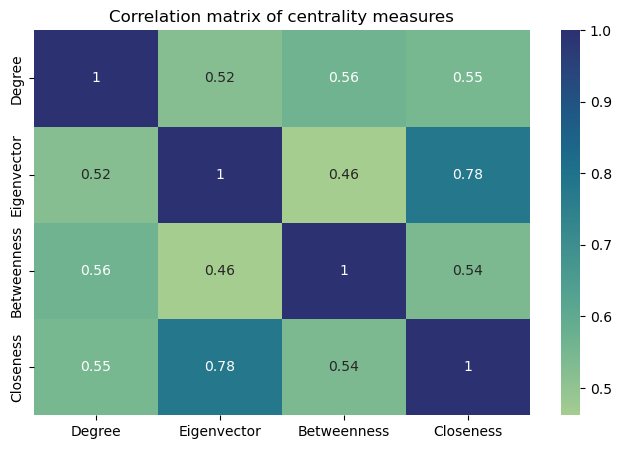

In [473]:
df_centrality = pd.DataFrame({
    'Degree': pd.Series(degree_centrality),
    'Eigenvector': pd.Series(eigenvector_centrality),
    'Betweenness': pd.Series(between_centrality),
    'Closeness': pd.Series(close_centrality)
})
corr = df_centrality.corr(method='kendall')

plt.figure(figsize=(8,5))
sns.heatmap(corr, annot=True, cmap='crest')
plt.title('Correlation matrix of centrality measures')
plt.show()

The matrix shows the Kendall correlation coefficient between the different centrality measures. The values range from 0.46 to 0.78, indicating a moderate to strong positive correlation between the centrality measures.

The highest correlation is between Eigenvector centrality and Closeness centrality, which suggests that nodes that are central in terms of closeness are also influential in terms of connections. This could be due to the fact that nodes that are close to other nodes are more likely to be influential.

The lowest correlation is between Eigenvector centrality and Betweenness centrality, which suggests that nodes that are influential in terms of connections may not necessarily be central in terms of shortest paths. 

## Community Detection

### Louvain method

The Louvain method is a greedy optimization method that attempts to optimize the modularity of a partition of the network. 

Steps:
1. Initialize each node in its own community
2. For **each node**, calculate the modularity gain of **moving** it to its neighbor's community
3. Move the node to the neighbor's community that results in the highest modularity gain
4. Repeat steps 2 and 3 until no further modularity gain can be achieved (consider a community as a single super-node and repeat the process)


In [216]:
louvain = community.louvain_communities(G, weight='weight', seed=42)
n_communities_louvain = len(louvain)
print(f'Number of communities: {n_communities_louvain}')

Number of communities: 32


In [217]:
louvain_layers = list(community.louvain_partitions(G, weight='weight', seed=42))
n_layers = len(louvain_layers)
print(f'Number of layers: {n_layers}')

Number of layers: 3


In [218]:
for i, e in enumerate(louvain_layers):
    print(f'Layer {i+1}: {len(e)} communities')

Layer 1: 82 communities
Layer 2: 33 communities
Layer 3: 32 communities


In [219]:
louvain = sorted(louvain, key=len, reverse=True)
for i, com in enumerate(louvain):
    print(f'Community {i + 1}: {len(com)} streamers')

Community 1: 1245 streamers
Community 2: 696 streamers
Community 3: 673 streamers
Community 4: 577 streamers
Community 5: 355 streamers
Community 6: 344 streamers
Community 7: 335 streamers
Community 8: 276 streamers
Community 9: 265 streamers
Community 10: 227 streamers
Community 11: 194 streamers
Community 12: 141 streamers
Community 13: 132 streamers
Community 14: 130 streamers
Community 15: 120 streamers
Community 16: 103 streamers
Community 17: 95 streamers
Community 18: 67 streamers
Community 19: 66 streamers
Community 20: 52 streamers
Community 21: 51 streamers
Community 22: 45 streamers
Community 23: 37 streamers
Community 24: 31 streamers
Community 25: 29 streamers
Community 26: 23 streamers
Community 27: 19 streamers
Community 28: 13 streamers
Community 29: 10 streamers
Community 30: 9 streamers
Community 31: 9 streamers
Community 32: 9 streamers


In [262]:
louvain_sizes = [len(com) for com in louvain]
avg_lou_size = np.mean(louvain_sizes)
max_lou_size = np.max(louvain_sizes)
min_lou_size = np.min(louvain_sizes)
print(f'Average community size: {avg_lou_size}')
print(f'Maximum community size: {max_lou_size}')
print(f'Minimum community size: {min_lou_size}')

Average community size: 199.3125
Maximum community size: 1245
Minimum community size: 9


The communities have a wide range of sizes, with the largest community having 1245 streamers and the smallest community having 9 streamers. 

In [289]:
def assign_community(G, community, name):
    for i, l_com in enumerate(community):
        for n in l_com: 
            G.nodes[n][name] = i

In [220]:
assign_community(G, louvain, 'com_louv')

### Greedy modularity optimization

The greedy modularity optimization method is another approach to community detection that aims to maximize the modularity of the network.

Steps:
1. Initialize each node in its own community
2. For each pair of nodes, calculate the modularity gain of **merging their communities**
3. Merge the communities that result in the highest modularity gain
4. Repeat steps 2 and 3 until no further modularity gain can be achieved

In [221]:
greedy_modularity = community.greedy_modularity_communities(G, weight='weight') # Long time to compute because of the size of the graph
n_communities_greedy_modularity = len(greedy_modularity)
print(f'Number of communities: {n_communities_greedy_modularity}')

Number of communities: 31


In [222]:
greedy_modularity = sorted(greedy_modularity, key=len, reverse=True)
for i, com in enumerate(greedy_modularity):
    print(f'Community {i + 1}: {len(com)} streamers')

Community 1: 1612 streamers
Community 2: 999 streamers
Community 3: 765 streamers
Community 4: 557 streamers
Community 5: 367 streamers
Community 6: 361 streamers
Community 7: 265 streamers
Community 8: 194 streamers
Community 9: 171 streamers
Community 10: 143 streamers
Community 11: 120 streamers
Community 12: 116 streamers
Community 13: 104 streamers
Community 14: 95 streamers
Community 15: 75 streamers
Community 16: 67 streamers
Community 17: 64 streamers
Community 18: 52 streamers
Community 19: 49 streamers
Community 20: 30 streamers
Community 21: 28 streamers
Community 22: 23 streamers
Community 23: 23 streamers
Community 24: 19 streamers
Community 25: 18 streamers
Community 26: 13 streamers
Community 27: 11 streamers
Community 28: 10 streamers
Community 29: 9 streamers
Community 30: 9 streamers
Community 31: 9 streamers


In [263]:
greedy_modularity_sizes = [len(com) for com in greedy_modularity]
avg_greedy_size = np.mean(greedy_modularity_sizes)
max_greedy_size = np.max(greedy_modularity_sizes)
min_greedy_size = np.min(greedy_modularity_sizes)
print(f'Average community size: {avg_greedy_size}')
print(f'Maximum community size: {max_greedy_size}')
print(f'Minimum community size: {min_greedy_size}')

Average community size: 205.74193548387098
Maximum community size: 1612
Minimum community size: 9


Bigger communities are formed with this method respect to the Louvain method, this is also due to the fact that with greedy modularity optimization we get 1 less community than the Louvain method.

In [223]:
assign_community(G, greedy_modularity, 'com_greedy')

### Comparison between the two methods

In [ ]:
com_louv = [G.nodes[n]['com_louv'] for n in G.nodes]
com_greedy = [G.nodes[n]['com_greedy'] for n in G.nodes]

nmi = normalized_mutual_info_score(com_louv, com_greedy)
print(f'Normalized mutual information: {round(nmi,3)}') 

Normalized mutual information: 0.839


The normalized mutual information is a measure of the similarity between two partitions of a graph. It ranges from 0 to 1, where:
- 1 indicates that the partitions are identical
- 0 indicates that the partitions are independent

The normalized mutual information between the Louvain and Greedy modularity optimization communities is 0.84. This indicates that the two community detection algorithms produce similar results in terms of partitioning the streamers into communities.

In [225]:
# export to Gephi
nx.write_gexf(G, 'streamer_community.gexf')

### Visualization of the communities

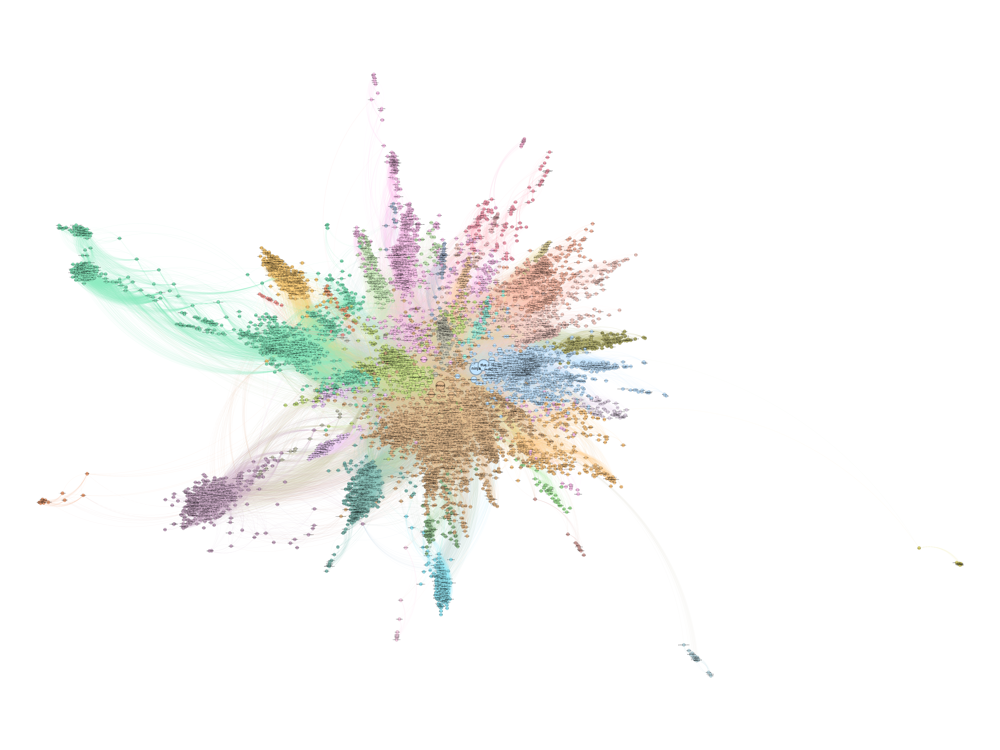

In [257]:
# show image twitch_community.png 
Image(filename='Images/twitch_community.png')

In [294]:
def community_users(G, community, n = 10):
    for i, com in enumerate(community):
        print(f'Community {i + 1}: {len(com)} streamers')
        for node in top_size(G.subgraph(com), n):
            print(f"{node[0]}: {node[1]['user_count']} users")  
        print("-"*50)

In [295]:
community_users(G, louvain)

Community 1: 1245 streamers
shroud: 11011 users
sodapoppin: 5982 users
summit1g: 5243 users
asmongold: 4677 users
xqcow: 4069 users
drdisrespect: 3888 users
lirik: 3076 users
amouranth: 2930 users
forsen: 1989 users
chocotaco: 1980 users
--------------------------------------------------
Community 2: 696 streamers
ninja: 17154 users
tfue: 14460 users
nickmercs: 5953 users
dakotaz: 5939 users
fortnite: 5721 users
timthetatman: 5367 users
symfuhny: 5263 users
drlupo: 3829 users
myth: 3787 users
couragejd: 3677 users
--------------------------------------------------
Community 3: 673 streamers
dota2ruhub: 2713 users
mdldisney: 1680 users
esl_dota2: 1677 users
admiralbulldog: 1413 users
epicenter_en1: 1300 users
stray228: 1244 users
alohadancetv: 1218 users
gorgc: 1156 users
silvername: 1073 users
dreadztv: 989 users
--------------------------------------------------
Community 4: 577 streamers
esl_csgo: 5170 users
dreamhack: 2917 users
faceittv: 2310 users
alanzoka: 2102 users
jukes: 1507 

In [268]:
def top_attributes_community(G, community, n=3):
    for i, com in enumerate(community):
        print(f'Community {i + 1}: {len(com)} streamers')
        languages = {}
        topics = {}
        for node in com:
            language = G.nodes[node].get('language', 'Not found')
            topic = G.nodes[node].get('topic', 'Not found')
            languages[language] = languages.get(language, 0) + 1
            topics[topic] = topics.get(topic, 0) + 1
        print('Languages:')
        for language, count in sorted(languages.items(), key=lambda x: x[1], reverse=True)[:n]:
            print(f'{language}: {count} streamers')
        print('Topics:')
        for topic, count in sorted(topics.items(), key=lambda x: x[1], reverse=True)[:n]:
            print(f'{topic}: {count} streamers')
        print("-"*50)

In [269]:
print('Louvain communities:')
top_attributes_community(G, louvain, n=5)

Louvain communities:
Community 1: 1245 streamers
Languages:
English: 989 streamers
Not found: 199 streamers
German: 23 streamers
Russian: 12 streamers
Japanese: 7 streamers
Topics:
Not found: 206 streamers
World of Warcraft: 140 streamers
Just Chatting: 138 streamers
Grand Theft Auto V: 84 streamers
PUBG: BATTLEGROUNDS: 45 streamers
--------------------------------------------------
Community 2: 696 streamers
Languages:
English: 382 streamers
Not found: 188 streamers
Spanish: 49 streamers
Arabic: 46 streamers
Danish: 16 streamers
Topics:
Fortnite: 279 streamers
Not found: 190 streamers
Call of Duty: Warzone: 54 streamers
Just Chatting: 33 streamers
VALORANT: 16 streamers
--------------------------------------------------
Community 3: 673 streamers
Languages:
Russian: 372 streamers
Not found: 220 streamers
English: 61 streamers
Ukrainian: 13 streamers
Unknown: 3 streamers
Topics:
Not found: 244 streamers
Dota 2: 120 streamers
Just Chatting: 91 streamers
Counter-Strike: 39 streamers
Fort

### Community detection with the Louvain algorithm results
Based on [twitchtracker](https://twitchtracker.com), website from which I scraped the data, I can see that the communities detected by the Louvain algorithm correspond to different languages and topics. The communities are based on the common viewership patterns of streamers, with streamers in the same community having similar audiences. This indicates that communities on Twitch are formed based on shared interests and language preferences as expected.

In general we can find two different behaviors:
- The communities are based on the language of the streamers (English, Russian, French, etc.)
- The communities are based on the game that the streamers play (Fortnite, League of Legends, Hearthstone, etc.). This happens mainly for the English-speaking communities. But if we run community detection on the single communities we can find that the communities based on language can be divided in sub-communities based on the topics.


Community 1: General Variety Gaming Community (English-speaking)

Community 2: Fortnite-focused Community (English-speaking)

Community 3: Russian Community

Community 4: Portuguese/Brazilian Community

Community 5: French Community

Community 6: League of Legends/Hearthstone Community

Community 7: Korean Community

Community 8: German Community

Community 9: Turkish Community

Community 10: Spanish Community

Community 11: Chinese (Taiwan/Hong Kong) Community

Community 12: Polish Community

Community 13: Overwatch Community

Community 14: Thai Community

**Community 15: Italian Community**

Community 16: StarCraft/Magic Community

Community 17: Czech/Slovak Community

Community 18: RuneScape Community

Community 19: Japanese Community

Community 20: Hungarian Community

Community 21: Rocket League Community

Community 22: Online Poker Community

Communities 23-32 smaller communities mainly in English with specific games

In [474]:
def extract_community_data(G, communities):
    data = [
        {'community': i + 1, 'language': G.nodes[node].get('language', 'Not found'), 'topic': G.nodes[node].get('topic', 'Not found')} 
        for i, community in enumerate(communities)
        for node in community
    ] 
    return pd.DataFrame(data)

def get_top_attributes(df, group_col, n_top = 10, n_community = 10):
    grouped = df.groupby(['community', group_col]).size().reset_index(name='count')
    grouped = grouped[grouped[group_col] != 'Not found']
    
    top_items = (grouped.groupby(group_col)['count'].sum().nlargest(n_top).index)
    filtered = grouped[grouped[group_col].isin(top_items)]
    
    filtered = filtered[filtered['community'] <= n_community]
    
    return filtered

def plot_community_attributes(languages_df, topics_df, n_community):
    _, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,8))
    
    sns.barplot(data=languages_df, x='community', y='count', hue='language', ax=ax1)
    distinct_languages = languages_df['language'].nunique()
    ax1.set_title(f'Top {distinct_languages} Languages in the First {n_community} Communities')
    ax1.set_xlabel('Community')
    ax1.set_ylabel('Number of Streamers')
    ax1.legend(title='Language', loc='upper right')
    
    sns.barplot(data=topics_df, x='community', y='count', hue='topic', ax=ax2)
    distinct_topics = topics_df['topic'].nunique()
    ax2.set_title(f'Top {distinct_topics} Topics in the First {n_community} Communities')
    ax2.set_xlabel('Community')
    ax2.set_ylabel('Number of Streamers')
    ax2.legend(title='Topic', loc='upper right')
    
    plt.tight_layout() 
    plt.show()

def analyze_community_attributes(G, communities, n_top=10, n_community=10):
    community_data = extract_community_data(G, communities)
    filtered_languages = get_top_attributes(community_data, 'language', n_top, n_community)
    filtered_topics = get_top_attributes(community_data, 'topic', n_top, n_community)
    plot_community_attributes(filtered_languages, filtered_topics, n_community)

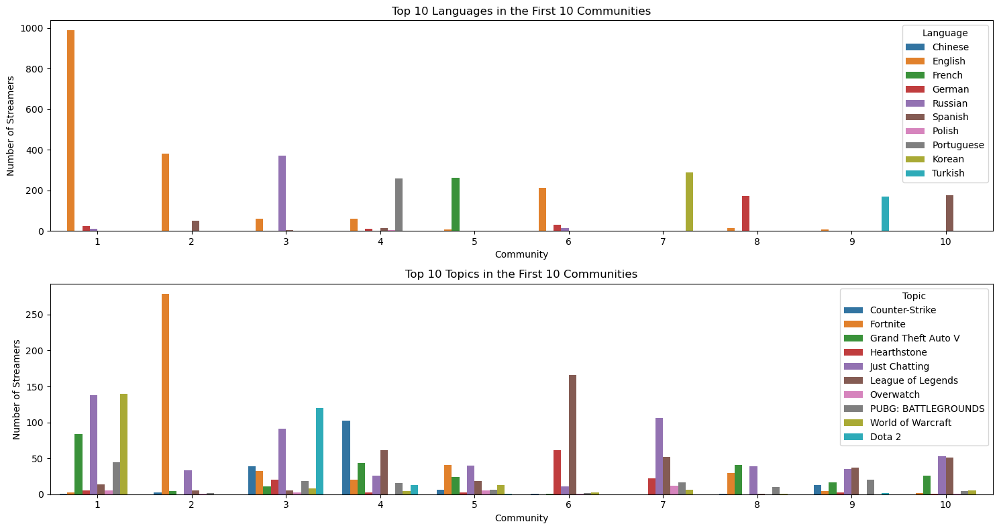

In [475]:
analyze_community_attributes(G, louvain)

### Analysis on the italian community

In [229]:
italian = louvain[14]
print(f'Italian community: {len(italian)} streamers')

Italian community: 120 streamers


In [230]:
italian_nodes = {n: G.nodes[n]['user_count'] for n in italian}
italian_nodes = dict(sorted(italian_nodes.items(), key=lambda x: x[1], reverse=True))
for node, user_count in italian_nodes.items():
    print(f'{node}: {user_count} users')

pow3r: 1153 users
therealmarzaa: 543 users
cicciogamer89: 488 users
zanoxvii: 406 users
rekinss: 388 users
kroatomist: 387 users
justgabbo: 343 users
matteohs: 314 users
ilmasseo: 287 users
efesto96: 256 users
luke4316live: 255 users
kekkobomba: 241 users
piazztwitch: 224 users
homyatol: 223 users
jrohn7: 218 users
vivalafazza: 200 users
attrix: 190 users
tumblurr: 190 users
paoloidolo: 185 users
justees: 178 users
tonytubo: 165 users
marcuskron: 162 users
pg_esports: 158 users
yoshi93: 150 users
cerystv: 145 users
terenas: 135 users
officialdelux: 127 users
zeb89: 121 users
nezak_: 119 users
ilgattosultubo: 119 users
yotobi: 112 users
fragolaqt: 106 users
gskianto: 105 users
jtaz_: 103 users
giuse360: 99 users
kurolily: 96 users
biboplayer: 94 users
fabio_denuzzo: 89 users
j0k3r: 86 users
haltv: 86 users
me_zora: 78 users
everyeyeit: 78 users
sabaku_no_sutoriimaa: 75 users
kodomoyuki: 72 users
kyrenis: 72 users
dizkohi: 70 users
multiplayerit: 70 users
canelupo1996: 70 users
itermosif

In [231]:
italian_subcommunity = community.louvain_communities(G.subgraph(italian), weight='weight', seed=42)
n_communities_italian = len(italian_subcommunity)
print(f'Number of communities: {n_communities_italian}')

Number of communities: 3


In [232]:
for i, com in enumerate(italian_subcommunity):
    print(f'Community {i + 1}: {len(com)} streamers')

Community 1: 37 streamers
Community 2: 53 streamers
Community 3: 30 streamers


In [233]:
for i, i_com in enumerate(italian_subcommunity):
    for n in i_com: 
        G.nodes[n]['com_italian'] = i

In [234]:
nx.write_gexf(G.subgraph(italian), 'italian_community.gexf')

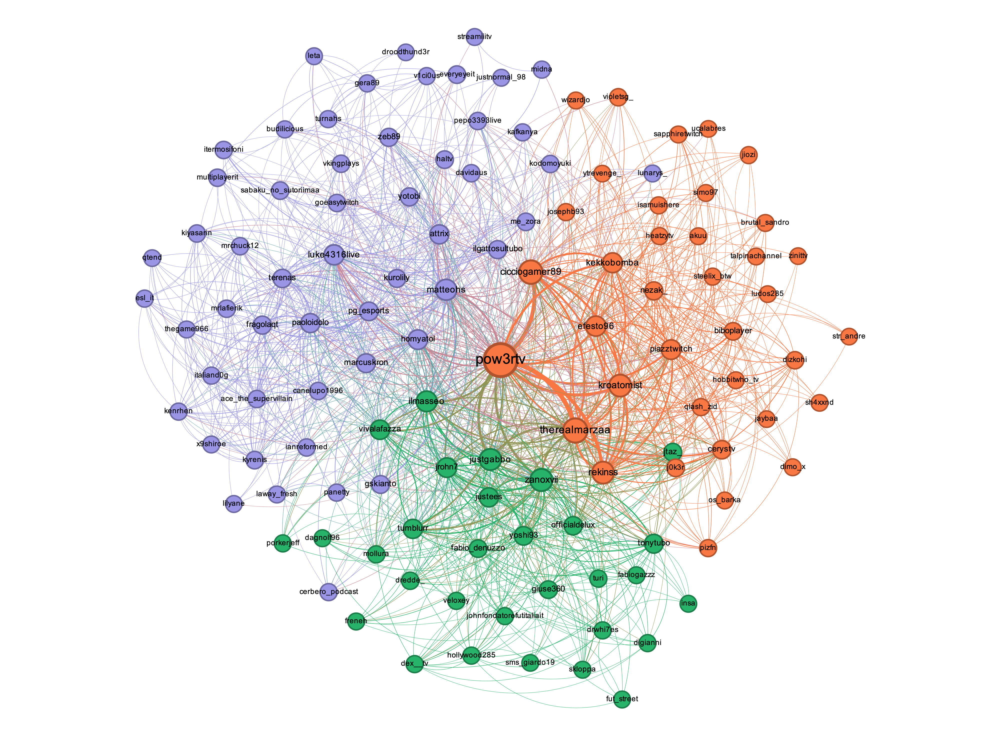

In [259]:
Image(filename='Images/italian_community.png')

In [286]:
top_attributes_community(G.subgraph(italian), italian_subcommunity, n=5)

Community 1: 37 streamers
Languages:
Italian: 23 streamers
Not found: 14 streamers
Topics:
Fortnite: 22 streamers
Not found: 14 streamers
Tom Clancy's Rainbow Six Siege: 1 streamers
--------------------------------------------------
Community 2: 53 streamers
Languages:
Italian: 39 streamers
Not found: 13 streamers
English: 1 streamers
Topics:
Not found: 13 streamers
League of Legends: 13 streamers
Just Chatting: 10 streamers
Hearthstone: 7 streamers
Grand Theft Auto V: 2 streamers
--------------------------------------------------
Community 3: 30 streamers
Languages:
Italian: 18 streamers
Not found: 12 streamers
Topics:
Not found: 12 streamers
FIFA 21: 4 streamers
FIFA 20: 4 streamers
Just Chatting: 4 streamers
FIFA 19: 2 streamers
--------------------------------------------------


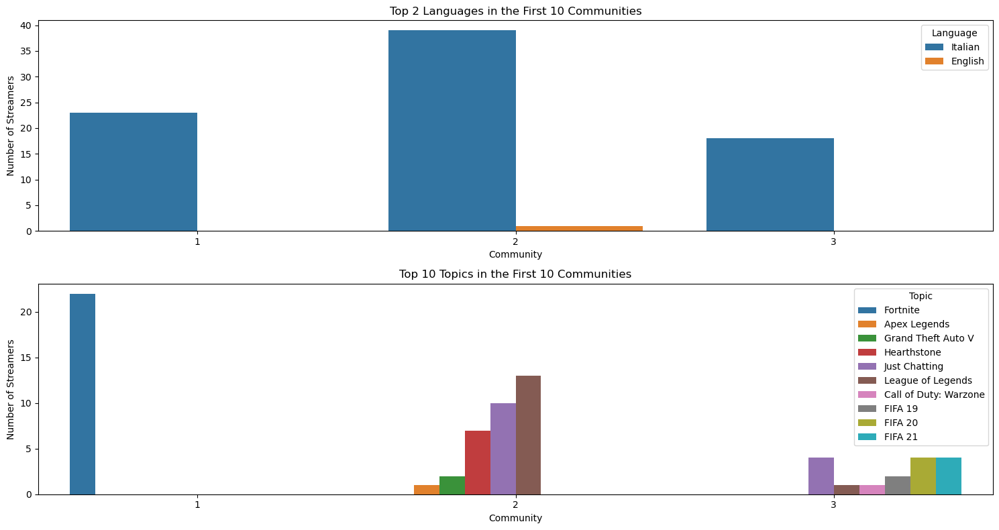

In [476]:
analyze_community_attributes(G, italian_subcommunity, n_top = 10)

In [284]:
for streamer in italian:
    lan = G.nodes()[streamer].get('language', 'Not found')
    if lan != 'Italian' and lan != 'Not found':
        print(streamer, lan)

midna English


Searching 'midna' on Twitch we can see that he is an italian streamer that plays mainly League of Legends, I don't know why streamtracker detected him as an english-speaking streamer.

### Comment on subcommunities

Looking at the community detection made on the subgraph of the Italian community we can see 3 communities. Not a lot becuase the dataset is not complete. 
However, we can see that the streamers in the Italian community form distinct communities based on their common viewers. This indicates that the streamers have different audiences and content:
- Orange community: Fortnite streamers
- Green community: Fifa streamers
- Purple community: Variety streamers

In [236]:
# subcommunity on commuity 1 
gaming = louvain[0]
gaming_sub = community.louvain_communities(G.subgraph(gaming), weight='weight', seed=42)
gaming_sub = sorted(gaming_sub, key=len, reverse=True)
n_communities_gaming = len(gaming_sub)
print(f'Number of communities: {n_communities_gaming}')

Number of communities: 11


In [237]:
for i, com in enumerate(gaming_sub):
    print(f'Community {i + 1}: {len(com)} streamers')

Community 1: 399 streamers
Community 2: 194 streamers
Community 3: 184 streamers
Community 4: 178 streamers
Community 5: 112 streamers
Community 6: 58 streamers
Community 7: 44 streamers
Community 8: 33 streamers
Community 9: 19 streamers
Community 10: 17 streamers
Community 11: 7 streamers


In [238]:
for i, g_com in enumerate(gaming_sub):
    for n in g_com: 
        G.nodes[n]['com_gaming'] = i

In [239]:
nx.write_gexf(G.subgraph(gaming), 'gaming_community.gexf')

In [296]:
community_users(G, gaming_sub)

Community 1: 399 streamers
shroud: 11011 users
summit1g: 5243 users
drdisrespect: 3888 users
lirik: 3076 users
chocotaco: 1980 users
cohhcarnage: 1946 users
diegosaurs: 1382 users
joshog: 1225 users
dizzy: 1196 users
tsm_viss: 1190 users
--------------------------------------------------
Community 2: 194 streamers
maximilian_dood: 1803 users
gamesdonequick: 1176 users
vgbootcamp: 1121 users
tru3ta1ent: 801 users
zero: 571 users
teamsp00ky: 556 users
clintstevens: 536 users
nairomk: 491 users
netherrealm: 482 users
rpglimitbreak: 453 users
--------------------------------------------------
Community 3: 184 streamers
sodapoppin: 5982 users
asmongold: 4677 users
esfandtv: 1833 users
methodjosh: 1487 users
quin69: 1166 users
swifty: 1070 users
towelliee: 1013 users
cdewx: 997 users
sco: 990 users
staysafetv: 989 users
--------------------------------------------------
Community 4: 178 streamers
xqcow: 4069 users
amouranth: 2930 users
forsen: 1989 users
greekgodx: 1528 users
reckful: 1260 u

In [3]:
# Image(filename='Images/gaming_community.png') uncomment to see the image

In [300]:
top_attributes_community(G.subgraph(gaming), gaming_sub, n=5)

Community 1: 399 streamers
Languages:
English: 333 streamers
Not found: 54 streamers
Russian: 6 streamers
German: 2 streamers
French: 2 streamers
Topics:
Not found: 57 streamers
PUBG: BATTLEGROUNDS: 44 streamers
Tom Clancy's Rainbow Six Siege: 41 streamers
Escape from Tarkov: 35 streamers
Just Chatting: 31 streamers
--------------------------------------------------
Community 2: 194 streamers
Languages:
English: 162 streamers
Not found: 23 streamers
Japanese: 6 streamers
Spanish: 1 streamers
Italian: 1 streamers
Topics:
Not found: 23 streamers
Super Smash Bros. Ultimate: 20 streamers
Street Fighter V: 17 streamers
Super Smash Bros. Melee: 16 streamers
Mortal Kombat 11: 13 streamers
--------------------------------------------------
Community 3: 184 streamers
Languages:
English: 120 streamers
Not found: 39 streamers
German: 17 streamers
Russian: 6 streamers
Chinese: 1 streamers
Topics:
World of Warcraft: 129 streamers
Not found: 42 streamers
Just Chatting: 3 streamers
Warcraft III: 3 st

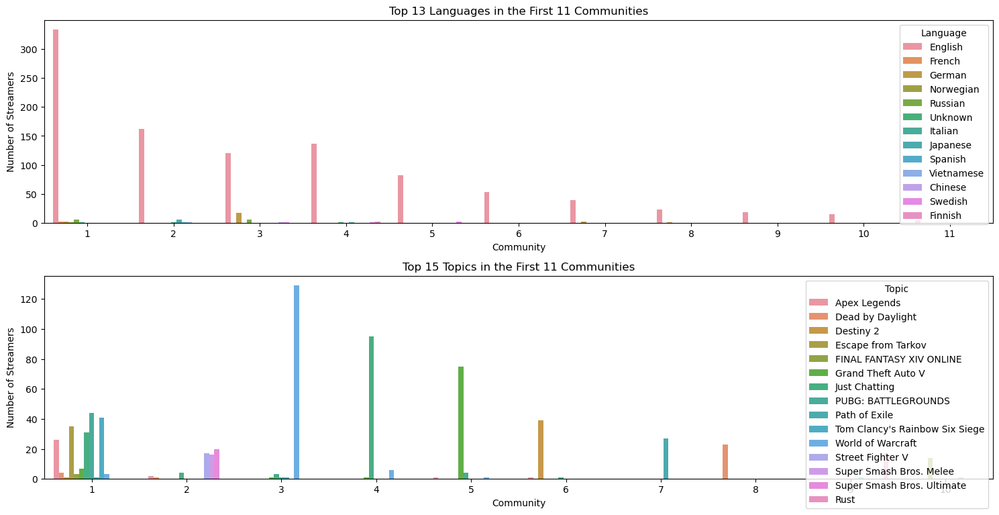

In [477]:
analyze_community_attributes(G, gaming_sub, n_top = 15, n_community = 11)

### Comment on the results of the subcommunity of the gaming community

The results of the subcommunity detection show that the streamers in the gaming community form distinct communities based on their common viewers. This indicates that the streamers in the gaming community have different audiences and content:

Community 1: FPS Gaming Community

Community 2: Fighting Games Community

Community 3: World of Warcraft Community

Community 4: Fighting Games Community

Community 5: Just Chatting Community

Community 6: GTA Community

Community 7: Destiny Community

Community 8: Path of Exile Community

Community 9: Dead by Daylight Community

Community 10: Rust Community

Community 11: Final Fantasy XIV Community

Community 12: Chess Community

From this results we can say that users that watch a streamer that plays a game are more likely to watch another streamer that plays games, but even more likely, to watch a streamer that plays the same game.

## Recommendations for Twitch

Algorithm to suggest streamers to users based on their common viewers. Can be used for example on the right side of the Twitch page where there are the suggested streamers.

The algorithm is based on Node2Vec, a method for learning continuous feature representations for nodes in networks.

The algorithm works as follows:
1. Generate random walks on the graph
2. Train a Word2Vec model on the random walks
3. Use the Word2Vec model to generate embeddings for the nodes
4. Use the embeddings to suggest similar nodes to a given node

In [332]:
def recommend_streamers(model, streamer, n=5):
    for node, _ in model.wv.most_similar(streamer)[:n]:
        print(node)

In [ ]:
node2vec = Node2Vec(G, dimensions=64, walk_length=25, num_walks=100, p=1, q=0.5, workers=1, weight_key='weight')
model = node2vec.fit(window=10, min_count=1, batch_words=256)

Computing transition probabilities:   0%|          | 0/6378 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 100/100 [05:18<00:00,  3.18s/it]


In [357]:
recommend_streamers(model, 'ninja')

tfue
dakotaz
fortnite
aydan
nickmercs


In [ ]:
recommend_streamers(model, 'shroud')

drdisrespect
summit1g
lirik
sodapoppin
joshog


In [ ]:
recommend_streamers(model, 'tumblurr', n=10)

ilmasseo
justgabbo
therealmarzaa
jrohn7
vivalafazza
zanoxvii
dredde_
pow3r
homyatol
jtaz_


From my knowledge of Twitch, I can say that the algorithm works well because the recommended streamers are similar ones. This is because the embeddings capture the similarity between nodes based on their common viewers.

## Attribute prediction

Algorithm to predict the language and topic of a streamer based on the common viewers. Can be used for small streamers that don't have a lot of information on their profile.

The algorithm is based on the structural features (centrality measures, user_count, clustering coefficient, the average value of the neighbors, number of nodes and edges in the ego-graph) of the nodes in the graph and the Node2Vec embeddings.

I predict only the top 10 languages and topics because the other languages and topics have a very low number of streamers and the prediction would not be accurate.

In [429]:
G_no_missing = G.copy()
nodes = list(G_no_missing.nodes)
for node in nodes:
    if 'language' not in G_no_missing.nodes[node] or 'topic' not in G_no_missing.nodes[node]:
        G_no_missing.remove_node(node)

In [430]:
top_languages = pd.Series(nx.get_node_attributes(G_no_missing, 'language')).value_counts().head(10).index
print(top_languages)

Index(['English', 'Russian', 'Korean', 'French', 'Portuguese', 'Spanish',
       'German', 'Turkish', 'Chinese', 'Polish'],
      dtype='object')


In [431]:
G_top_languages = G_no_missing.copy()
nodes = list(G_top_languages.nodes)
for node in nodes:
    if G_top_languages.nodes[node]['language'] not in top_languages:
        G_top_languages.remove_node(node)

In [432]:
G_top_languages.order(), G_top_languages.size()

(4311, 129972)

In [436]:
def create_graph_features(G):
    features = {}
    for node in G.nodes():
        features[node] = {
            'clustering': nx.clustering(G, node),
            'user_count': G.nodes[node]['user_count'],
            'betweenness': nx.betweenness_centrality(G, weight='weight')[node],
            'eigenvector': nx.eigenvector_centrality(G, max_iter=300, weight='weight')[node],
        }
    avg_neighbor_degree = {}
    avg_neighbor_clustering = {}
    ego_node_count = {}
    ego_edge_count = {}
    for node in G.nodes:
        neighbors = list(G.neighbors(node))
        if neighbors:
            avg_neighbor_degree[node] = np.mean([G.degree(n) for n in neighbors])
            avg_neighbor_clustering[node] = np.mean([nx.clustering(G, n) for n in neighbors])
        else:
            avg_neighbor_degree[node] = 0
            avg_neighbor_clustering[node] = 0
        
        ego_graph = nx.ego_graph(G, node)
        ego_node_count[node] = len(ego_graph.nodes) - 1 
        ego_edge_count[node] = len(ego_graph.edges)
    
    features['avg_neighbor_degree'] = pd.Series(avg_neighbor_degree)
    features['avg_neighbor_clustering'] = pd.Series(avg_neighbor_clustering)
    features['ego_node_count'] = pd.Series(ego_node_count)
    features['ego_edge_count'] = pd.Series(ego_edge_count)
    
    return pd.DataFrame.from_dict(features, orient='index')

In [437]:
def compute_avg_neighbor_metrics(node, degrees, clustering):
    neighbors = degrees[node]['neighbors']
    if neighbors:
        avg_degree = np.mean([degrees[n]['degree'] for n in neighbors])
        avg_clustering = np.mean([clustering[n] for n in neighbors])
    else:
        avg_degree = 0
        avg_clustering = 0
    return node, avg_degree, avg_clustering

def compute_ego_metrics(node, G):
    ego_graph = nx.ego_graph(G, node)
    ego_node_count = len(ego_graph.nodes) - 1 
    ego_edge_count = len(ego_graph.edges)
    return node, ego_node_count, ego_edge_count

def create_graph_features(G):
    print("Betweenness centrality...")
    betweenness = nx.betweenness_centrality(G, weight='weight')
    print("Eigenvector centrality...")
    eigenvector = nx.eigenvector_centrality(G, max_iter=300, weight='weight')
    clustering = nx.clustering(G)

    degrees = {
        node: {
            'degree': G.degree(node),
            'neighbors': list(G.neighbors(node))
        }
        for node in G.nodes()
    }

    features = {
        node: {
            'degree': degrees[node]['degree'],
            'clustering': clustering[node],
            'user_count': G.nodes[node].get('user_count', 0),
            'betweenness': betweenness[node],
            'eigenvector': eigenvector[node],
        }
        for node in G.nodes()
    }

    print("Metrics on neighbors...")
    with parallel_backend("threading"):
        neighbor_results = Parallel(n_jobs=-1)(
            delayed(compute_avg_neighbor_metrics)(node, degrees, clustering) for node in G.nodes()
        )
    avg_neighbor_degree = {node: avg_deg for node, avg_deg, _ in neighbor_results}
    avg_neighbor_clustering = {node: avg_clust for node, _, avg_clust in neighbor_results}

    print("Metrics on ego-graphs...")
    with parallel_backend("threading"):
        ego_results = Parallel(n_jobs=-1)(
            delayed(compute_ego_metrics)(node, G) for node in G.nodes()
        )
    ego_node_count = {node: ego_nodes for node, ego_nodes, _ in ego_results}
    ego_edge_count = {node: ego_edges for node, _, ego_edges in ego_results}

    for node in G.nodes():
        features[node].update({
            'avg_neighbor_degree': avg_neighbor_degree[node],
            'avg_neighbor_clustering': avg_neighbor_clustering[node],
            'ego_node_count': ego_node_count[node],
            'ego_edge_count': ego_edge_count[node],
        })

    print("Done.")
    return pd.DataFrame.from_dict(features, orient='index')

def create_node_embeddings(G, dimensions=64):
    node2vec = Node2Vec(G, dimensions=dimensions, walk_length=25, num_walks=100, p=1, q=0.5, workers=1, weight_key='weight')
    model = node2vec.fit(window=10, min_count=1, batch_words=256)
    
    embeddings = {}
    for node in G.nodes():
        embeddings[node] = model.wv[str(node)]
    
    return pd.DataFrame.from_dict(embeddings, orient='index')

In [455]:
def predict_attributes(G, target):
    structural_features = create_graph_features(G)
    node_embeddings = create_node_embeddings(G)

    features = pd.concat([structural_features, node_embeddings], axis=1)
    attributes = [G.nodes[node][target] for node in G.nodes()]
    features.columns = features.columns.astype(str)

    encoder = LabelEncoder()
    encoded = encoder.fit_transform(attributes)

    X_train, X_test, y_train, y_test = train_test_split(features, encoded, test_size=0.2, random_state=42) # stratify
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
            
    unique_classes = np.unique(y_test)
    attribute = target.capitalize()
    print(f"{attribute} Prediction Results:")
    print(classification_report(y_test, y_pred, labels=unique_classes, target_names=encoder.inverse_transform(unique_classes)))

In [456]:
predict_attributes(G_top_languages, 'language')

Betweenness centrality...
Eigenvector centrality...
Metrics on neighbors...
Metrics on ego-graphs...
Done.


Computing transition probabilities:   0%|          | 0/4311 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 100/100 [03:18<00:00,  1.99s/it]


Language Prediction Results:
              precision    recall  f1-score   support

     Chinese       1.00      1.00      1.00        28
     English       0.97      0.99      0.98       415
      French       1.00      0.95      0.97        58
      German       0.98      0.94      0.96        54
      Korean       0.98      0.97      0.97        59
      Polish       1.00      0.91      0.95        23
  Portuguese       0.94      1.00      0.97        59
     Russian       1.00      0.97      0.99        77
     Spanish       0.98      0.94      0.96        54
     Turkish       1.00      1.00      1.00        36

    accuracy                           0.98       863
   macro avg       0.99      0.97      0.98       863
weighted avg       0.98      0.98      0.98       863



From the results we can see that the algorithm is able to predict the language of the streamer with high accuracy. 

In [457]:
top_topics = pd.Series(nx.get_node_attributes(G_top_languages, 'topic')).value_counts().head(10).index
print(top_topics)

Index(['Just Chatting', 'League of Legends', 'Fortnite', 'Grand Theft Auto V',
       'World of Warcraft', 'Counter-Strike', 'PUBG: BATTLEGROUNDS',
       'Hearthstone', 'Dota 2', 'Overwatch'],
      dtype='object')


In [458]:
G_top_topics = G_no_missing.copy()
nodes = list(G_top_topics.nodes)
for node in nodes:
    if G_top_topics.nodes[node]['topic'] not in top_topics:
        G_top_topics.remove_node(node)

In [462]:
predict_attributes(G_top_topics, 'topic')

Betweenness centrality...
Eigenvector centrality...
Metrics on neighbors...
Metrics on ego-graphs...
Done.


Computing transition probabilities:   0%|          | 0/2933 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 100/100 [01:39<00:00,  1.01it/s]


Topic Prediction Results:
                     precision    recall  f1-score   support

     Counter-Strike       0.89      0.79      0.84        39
             Dota 2       0.92      0.88      0.90        25
           Fortnite       0.91      0.96      0.93        97
 Grand Theft Auto V       0.84      0.73      0.78        70
        Hearthstone       0.93      0.76      0.83        33
      Just Chatting       0.68      0.85      0.76       137
  League of Legends       0.91      0.86      0.89       108
          Overwatch       1.00      0.87      0.93        15
PUBG: BATTLEGROUNDS       0.82      0.62      0.71        37
  World of Warcraft       1.00      0.96      0.98        26

           accuracy                           0.84       587
          macro avg       0.89      0.83      0.85       587
       weighted avg       0.85      0.84      0.84       587



From the results we can see that the algorithm is able to predict the topic of the streamer with high accuracy. 

The algorithm has some difficulties in predicting the topic of the streamer when the topic is 'Just Chatting'. This is probably because those streamers have a very diverse contents.